In [18]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from copy import deepcopy
import os
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from sklearn import linear_model
import seaborn as sns
from sklearn import metrics

In [19]:
#data = pd.read_csv('OnlineNewsPopularity.csv')
data = pd.read_csv('D:\dm\project\OnlineNewsPopularity.csv')


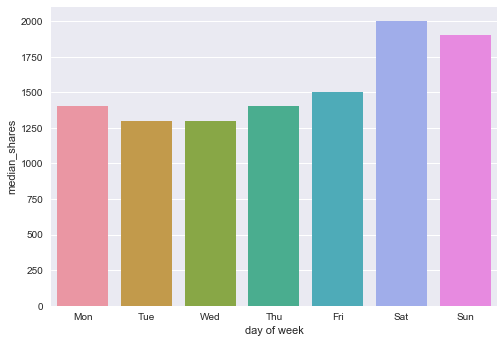

In [21]:

shares = []
for d in [' weekday_is_monday', ' weekday_is_tuesday', ' weekday_is_wednesday',' weekday_is_thursday', ' weekday_is_friday', ' weekday_is_saturday',
       ' weekday_is_sunday']:
    shares.append(data[data[d]==1][' shares'].median())

    #sns.distplot(data[data[d]==1][' shares'].apply(np.log))
    #plt.show()
ax = sns.barplot(x= ['Mon','Tue','Wed','Thu','Fri','Sat','Sun'], y= shares)
ax.set(xlabel='day of week', ylabel='median_shares')
plt.show()

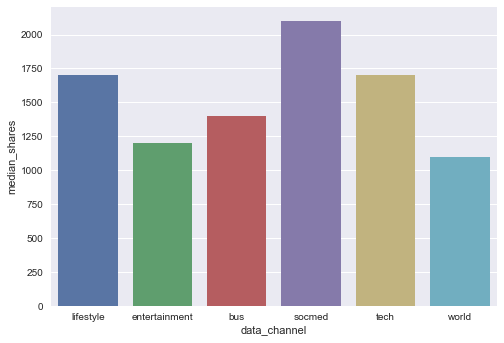

In [22]:

channel = []
for d in [' data_channel_is_lifestyle',
       ' data_channel_is_entertainment', ' data_channel_is_bus',
       ' data_channel_is_socmed', ' data_channel_is_tech',
       ' data_channel_is_world']:
    channel.append(data[data[d]==1][' shares'].median())

    #sns.distplot(data[data[d]==1][' shares'].apply(np.log))
    #plt.show()
ax = sns.barplot(x= ['lifestyle',
       'entertainment', 'bus',
       'socmed', 'tech',
       'world'], y= channel)
ax.set(xlabel='data_channel', ylabel='median_shares')
plt.show()

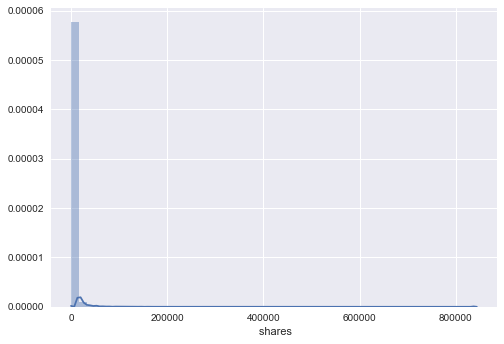

In [23]:
sns.distplot(data[' shares'])
plt.show()

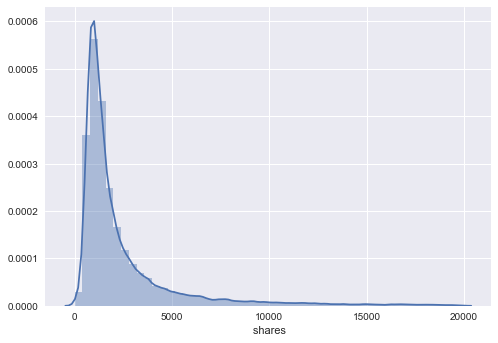

In [24]:
sns.distplot(data[data[' shares']<20000][' shares'])
plt.show()

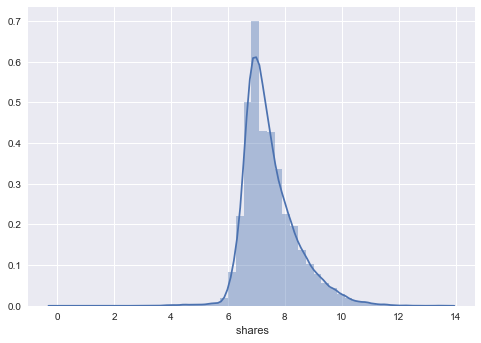

In [25]:
sns.distplot(data[' shares'].apply(np.log))
plt.show()

In [4]:
#custom coding
#applying minmax normalization to the data
#contributed by Vedasri
new_data = deepcopy(data)
del new_data['url']
del new_data[' timedelta']
new_data = new_data.apply(pd.to_numeric, errors='coerce')
columns = set(new_data.columns)
columns.remove(' shares')
for feature_name in list(columns):
    max_value = new_data[feature_name].max()
    min_value = new_data[feature_name].min()
    new_data[feature_name] = (new_data[feature_name] - min_value) / (max_value - min_value)

In [8]:
pca = PCA(n_components = 3)
#ca.fit(new_data)
principalComponents = pca.fit(data[list(columns)])
print(pca.explained_variance_ratio_)  
#print(pca.components_)  
comp = pca.components-_
pca_trans = pca.transform(data[list(columns)])
#pd.DataFrame(data = new_data)

[ 0.7628241   0.16383047  0.03532646]


In [9]:
new_data[' shares'] = new_data[' shares'].apply(np.log)
new_data[' shares'].median()

7.24422751560335

In [10]:

nom_vals = list(np.where(new_data[' shares']<=7, 'r', 'b'))
data3 = np.array(pca_trans)


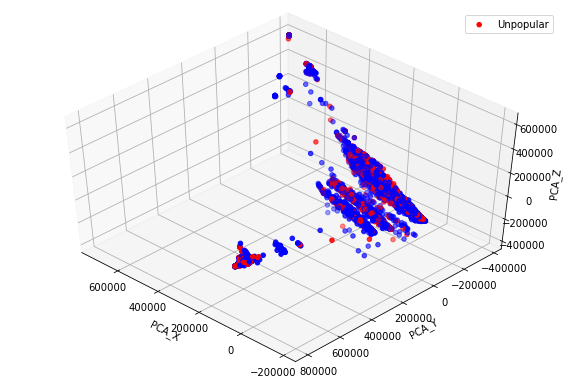

In [11]:
#Custom Coding
#Plotting principal components in 3D.
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(1, figsize=(8, 5))

ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

#y = np.choose(new_data, [0,1]).astype(float)
ax.scatter(data3[:, 1], data3[:, 0], data3[:, 2], c=nom_vals, cmap=plt.cm.spectral,label=['Unpopular','Popular']
          )
ax.set_xlabel("PCA_X")
ax.set_ylabel("PCA_Y")
ax.set_zlabel("PCA_Z")
ax.legend(['Unpopular','Popular'])
plt.show()

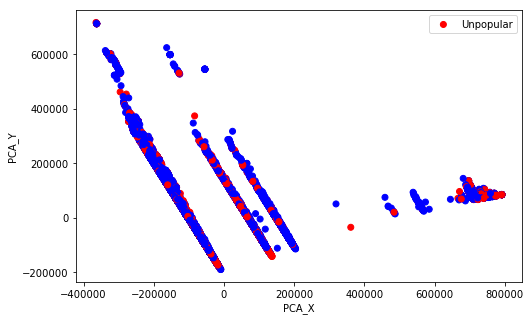

In [12]:
fig = plt.figure(1, figsize=(8, 5))


#y = np.choose(new_data, [0,1]).astype(float)
plt.scatter(data3[:, 0], data3[:, 1], c=nom_vals, cmap=plt.cm.spectral
          )
plt.xlabel("PCA_X")
plt.ylabel("PCA_Y")
plt.legend(['Unpopular','Popular'])
plt.show()

In [13]:
#Custom coding
#finding pairs of attributes that have correlation coefficient between 0.8 and 1.0
c = data[list(columns)].corr().abs()
s = c.unstack()
so = s.sort_values(kind="quicksort")
so = pd.DataFrame(data=so, columns=['Pearson Coeff'])
so = so[(so['Pearson Coeff'] >= 0.8) & (so['Pearson Coeff'] < 1.0)]
so.iloc[::2]


Pearson Coeff
 kw_avg_avg                  kw_max_avg                      0.811864
 self_reference_avg_sharess  self_reference_min_shares       0.818907
 LDA_02                      data_channel_is_world           0.836618
 self_reference_avg_sharess  self_reference_max_shares       0.853480
 kw_max_max                  kw_min_min                      0.857226
 kw_max_min                  kw_avg_min                      0.940529
 n_non_stop_unique_tokens    n_non_stop_words                0.999532
 n_unique_tokens             n_non_stop_words                0.999572
                             n_non_stop_unique_tokens        0.999852

In [ ]:
#custom coding
#feature subset selection
listt = [' weekday_is_saturday',' weekday_is_sunday',' kw_min_min', ' kw_max_min',
       ' kw_min_max', ' kw_max_max', ' kw_min_avg',
       ' kw_max_avg', ' self_reference_min_shares',
       ' self_reference_max_shares',' n_non_stop_words',' min_positive_polarity', ' max_positive_polarity',' min_negative_polarity',
       ' max_negative_polarity']

for i in listt:
    columns.remove(i)

In [27]:
rd = pd.DataFrame(data = listt)
rd

,0
0,weekday_is_saturday
1,weekday_is_sunday
2,kw_min_min
3,kw_max_min
4,kw_min_max
5,kw_max_max
6,kw_min_avg
7,kw_max_avg
8,self_reference_min_shares
9,self_reference_max_shares


In [28]:
columns_all = columns
columns_all.add(' shares')

In [32]:
#Custom coding
#splitting the given data into training and test data.
#Also discretized the shares attribute for classification problems
sel_df = new_data[list(columns_all)]
sel_df['shares_nom'] = np.where(sel_df[' shares']<=7,0,1)
train_df = sel_df.sample(frac=0.75, random_state = 150)
test_df = sel_df.drop(train_df.index)
train_y = train_df[' shares']
train_y_nom = train_df['shares_nom']
del train_df[' shares']
del train_df['shares_nom']
test_y = test_df[' shares']
test_nom_y = test_df['shares_nom']
del test_df[' shares']
del test_df['shares_nom']

C:\Users\pavan\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


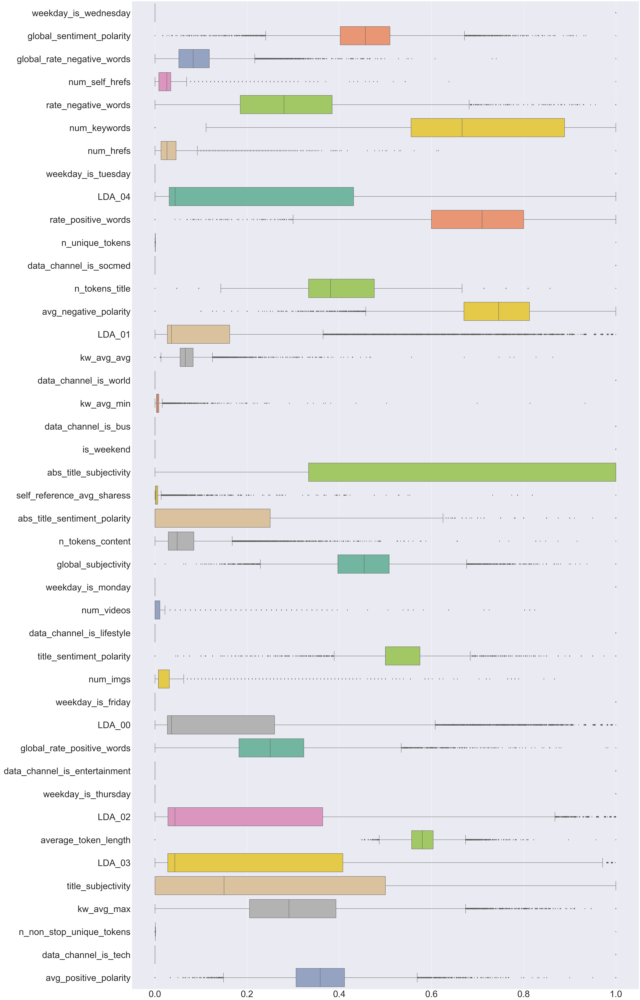

In [33]:
import seaborn as sns
rc={'font.size': 32, 'axes.labelsize': 32, 'legend.fontsize': 32.0, 
    'axes.titlesize': 32, 'xtick.labelsize': 50, 'ytick.labelsize': 50}
plt.rcParams.update(**rc)

fig2, ax2 = plt.subplots(nrows=1, ncols=1,figsize=(50, 100))
b = sns.boxplot(data=train_df, orient="h", palette="Set2", ax = ax2)
sns.plt.show()




In [35]:
from sklearn.ensemble import RandomForestClassifier

In [36]:
>>> from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

In [137]:
rf = RandomForestClassifier(n_estimators = 100, max_depth = 20, bootstrap = True)   

X = train_df
y = train_y_nom

rf.fit(X,y) 
y_pred = rf.predict(test_df)
probs = rf.predict_proba(test_df)
#print("Confusion matrix:\n%s" % cm)
print("Accuracy is %s" % accuracy_score(test_nom_y, y_pred))

print(classification_report(test_nom_y, y_pred))

Accuracy is 0.71718292806
             precision    recall  f1-score   support

          0       0.59      0.29      0.39      3084
          1       0.74      0.91      0.82      6827

avg / total       0.69      0.72      0.68      9911



In [40]:
df_confusion = pd.crosstab(test_nom_y, y_pred, rownames=['Actual'], colnames=['Predicted'], margins=True)
print(df_confusion)

Predicted     0     1   All
Actual                     
0           881  2203  3084
1           614  6213  6827
All        1495  8416  9911


In [43]:
columns.remove(' shares')

                         attribute  importance
15                      kw_avg_avg    0.063017
21      self_reference_avg_sharess    0.044341
35                          LDA_02    0.041526
17                      kw_avg_min    0.040197
39                      kw_avg_max    0.039148
14                          LDA_01    0.038520
8                           LDA_04    0.036729
40        n_non_stop_unique_tokens    0.034679
31                          LDA_00    0.034674
37                          LDA_03    0.034457
24             global_subjectivity    0.034401
36            average_token_length    0.034269
42           avg_positive_polarity    0.033366
23                n_tokens_content    0.033231
32      global_rate_positive_words    0.033205
10                 n_unique_tokens    0.033139
1        global_sentiment_polarity    0.032813
13           avg_negative_polarity    0.030800
2       global_rate_negative_words    0.030219
4              rate_negative_words    0.026177
9            

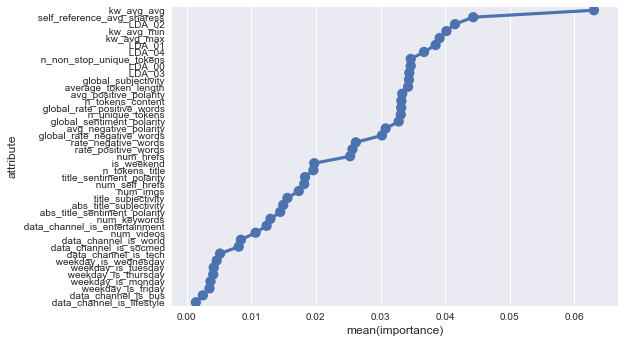

In [48]:
#Custom coding
#Retrieving feature importances from the Random Forest model
rf_feature = pd.DataFrame(data = list(columns),columns = ['attribute'])
rf_feature['importance'] = rf.feature_importances_

rf_feature = rf_feature.sort_values(by='importance', ascending = False)
print(rf_feature)
rf_sel = list(rf_feature[rf_feature['importance']>0.01]['attribute'])
rf_sel

rc={'font.size': 12, 'axes.labelsize': 12, 'legend.fontsize': 12.0, 
    'axes.titlesize': 12, 'xtick.labelsize': 10, 'ytick.labelsize': 10}
plt.rcParams.update(**rc)
sns.pointplot(x='importance', y='attribute', data=rf_feature)
plt.show()

2   0.688830592271
Accuracy is 0.688830592271
             precision    recall  f1-score   support

          0       0.00      0.00      0.00      3084
          1       0.69      1.00      0.82      6827

avg / total       0.47      0.69      0.56      9911



C:\Users\pavan\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1113: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


6   0.702250025224
Accuracy is 0.702250025224
             precision    recall  f1-score   support

          0       0.63      0.10      0.18      3084
          1       0.71      0.97      0.82      6827

avg / total       0.68      0.70      0.62      9911

10   0.711835334477
Accuracy is 0.711835334477
             precision    recall  f1-score   support

          0       0.61      0.21      0.31      3084
          1       0.72      0.94      0.82      6827

avg / total       0.69      0.71      0.66      9911

14   0.715669458178
Accuracy is 0.715669458178
             precision    recall  f1-score   support

          0       0.60      0.27      0.37      3084
          1       0.73      0.92      0.82      6827

avg / total       0.69      0.72      0.68      9911

18   0.717485622036
Accuracy is 0.717485622036
             precision    recall  f1-score   support

          0       0.59      0.30      0.39      3084
          1       0.74      0.91      0.82      6827

avg / t

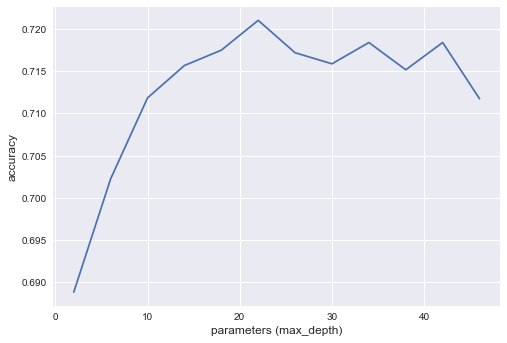

In [51]:
#Custom coding to see how the performace is changing by varying parameter max_depth in random forest.
a = []
b = []
for j in range(2,50,4):
    rf = RandomForestClassifier(n_estimators = 100, max_depth = j, bootstrap = True)   

    X = train_df
    y = train_y_nom

    rf.fit(X,y) 
    y_pred = rf.predict(test_df)
    probs = rf.predict_proba(test_df)
        #print("Confusion matrix:\n%s" % cm)
    acc = accuracy_score(test_nom_y, y_pred)
    a.append(j)
    b.append(acc)
    print(j," ",acc)
    print("Accuracy is %s" % acc)
    print(classification_report(test_nom_y, y_pred))
        
plt.plot(a,b)
plt.xlabel('parameters (max_depth)')
plt.ylabel('accuracy')
plt.show()

10   0.678236303098
Accuracy is 0.678236303098
             precision    recall  f1-score   support

          0       0.48      0.37      0.42      3084
          1       0.74      0.82      0.78      6827

avg / total       0.66      0.68      0.67      9911

30   0.706185046918
Accuracy is 0.706185046918
             precision    recall  f1-score   support

          0       0.55      0.31      0.40      3084
          1       0.74      0.88      0.81      6827

avg / total       0.68      0.71      0.68      9911

50   0.718393703965
Accuracy is 0.718393703965
             precision    recall  f1-score   support

          0       0.59      0.30      0.40      3084
          1       0.74      0.91      0.82      6827

avg / total       0.70      0.72      0.69      9911

70   0.717082030068
Accuracy is 0.717082030068
             precision    recall  f1-score   support

          0       0.59      0.30      0.40      3084
          1       0.74      0.90      0.81      6827

avg / 

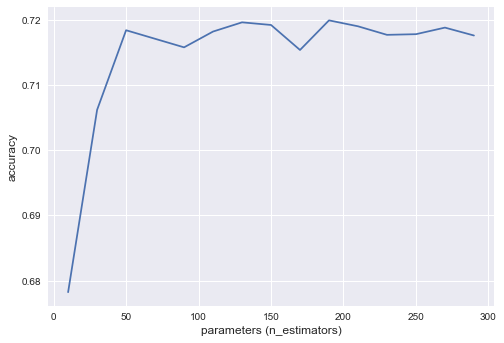

In [52]:
#Custom coding to see how the performace is changing by varying parameter n_estimators in random forest.
a = []
b = []
for j in range(10,300,20):
    rf = RandomForestClassifier(n_estimators = j, max_depth = 24, bootstrap = True)   

    X = train_df
    y = train_y_nom

    rf.fit(X,y) 
    y_pred = rf.predict(test_df)
    probs = rf.predict_proba(test_df)
        #print("Confusion matrix:\n%s" % cm)
    acc = accuracy_score(test_nom_y, y_pred)
    a.append(j)
    b.append(acc)
    print(j," ",acc)
    print("Accuracy is %s" % acc)
    print(classification_report(test_nom_y, y_pred))
        
plt.plot(a,b)
plt.xlabel('parameters (n_estimators)')
plt.ylabel('accuracy')
plt.show()

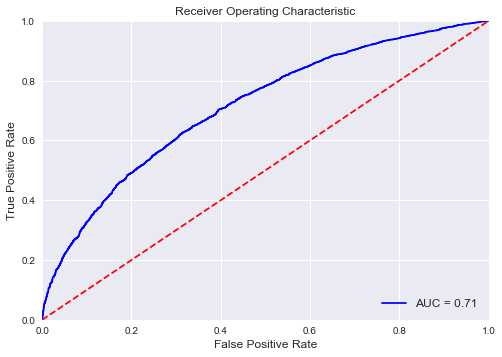

In [174]:
#Custom coding by choosing optimal value for the parameters and plotting the ROC Curve
rf = RandomForestClassifier(n_estimators = 50, max_depth = 22, bootstrap = True)   

X = train_df
y = train_y_nom

rf.fit(X,y) 
probs = rf.predict_proba(test_df)

fpr, tpr, thresholds = metrics.roc_curve(test_nom_y, probs[:, 1])
roc_auc = metrics.auc(fpr, tpr)

plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [76]:
#custom coding
#detecting outliers in data using 1.5IQR rule
#contributed by Pavani
out_data = deepcopy(sel_df)
for i, var_name in enumerate(out_data.columns):
        q75, q25 = np.percentile(out_data[var_name], [75 ,25])
        iqr = q75 - q25
        
        min = q25 - (iqr*1.5)
        max = q75 + (iqr*1.5)
        out_data = out_data.drop(out_data.loc[out_data[var_name] < min].index)
        out_data = out_data.drop(out_data.loc[out_data[var_name] > max].index)
len(out_data)

2111

In [74]:
len(data)

39644

Accuracy is 0.428917364544
             precision    recall  f1-score   support

          0       0.34      0.92      0.50      3084
          1       0.85      0.21      0.33      6827

avg / total       0.69      0.43      0.39      9911



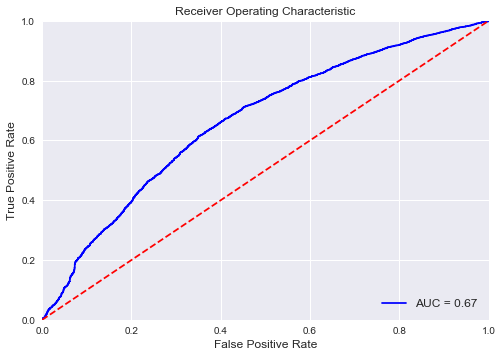

In [176]:
from sklearn.naive_bayes import GaussianNB
>>> gnb = GaussianNB()
X = train_df
y = train_y_nom

gnb.fit(X,y) 
y_pred = gnb.predict(test_df)
probs = gnb.predict_proba(test_df)
#print("Confusion matrix:\n%s" % cm)
print("Accuracy is %s" % accuracy_score(test_nom_y, y_pred))

print(classification_report(test_nom_y, y_pred))
fpr, tpr, thresholds = metrics.roc_curve(test_nom_y, probs[:, 1])
roc_auc = metrics.auc(fpr, tpr)

plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

Accuracy is 0.712541620422
                         attribute  importance
15                      kw_avg_avg    0.214210
11          data_channel_is_socmed    0.103481
19                      is_weekend    0.087013
21      self_reference_avg_sharess    0.074367
31                          LDA_00    0.061707
39                      kw_avg_max    0.055847
3                   num_self_hrefs    0.049197
33   data_channel_is_entertainment    0.045667
5                     num_keywords    0.039216
10                 n_unique_tokens    0.036964
16           data_channel_is_world    0.033938
41            data_channel_is_tech    0.026098
29                        num_imgs    0.019239
40        n_non_stop_unique_tokens    0.017853
14                          LDA_01    0.014813
30               weekday_is_friday    0.014562
28        title_sentiment_polarity    0.013431
17                      kw_avg_min    0.013117
6                        num_hrefs    0.011826
26                      num_video

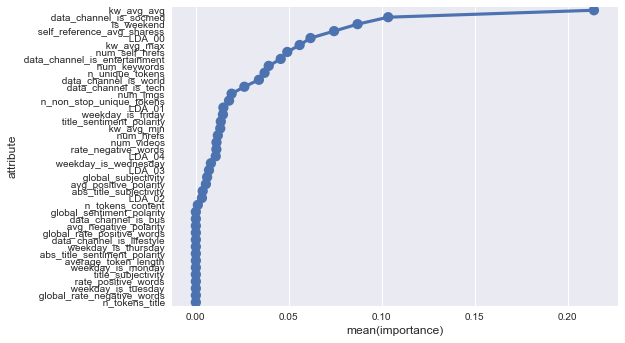

10   0.699929371406
             precision    recall  f1-score   support

          0       0.57      0.15      0.23      3084
          1       0.71      0.95      0.81      6827

avg / total       0.67      0.70      0.63      9911

30   0.707395822823
             precision    recall  f1-score   support

          0       0.56      0.30      0.39      3084
          1       0.74      0.89      0.81      6827

avg / total       0.68      0.71      0.68      9911

50   0.710624558571
             precision    recall  f1-score   support

          0       0.56      0.31      0.40      3084
          1       0.74      0.89      0.81      6827

avg / total       0.69      0.71      0.68      9911

70   0.713247906367
             precision    recall  f1-score   support

          0       0.57      0.31      0.40      3084
          1       0.74      0.90      0.81      6827

avg / total       0.69      0.71      0.68      9911

90   0.712541620422
             precision    recall  f1-sco

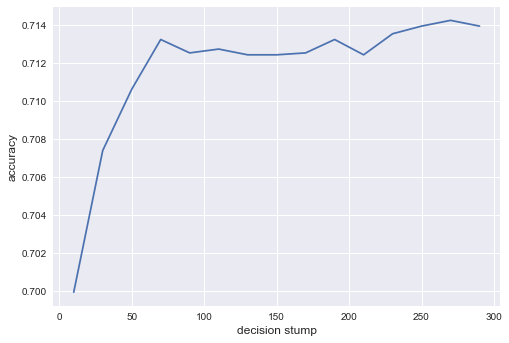

In [83]:
#Custom coding for Adaboost to get feature importances and to see how model is varying by changing the parameters.
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import make_gaussian_quantiles


X = train_df  # we only take the first two features.
Y = train_y_nom

# Create and fit an AdaBoosted decision tree
bdt = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1),
                         algorithm="SAMME",
                         n_estimators=200)

bdt.fit(X, Y)
Z = bdt.predict(test_df)
print("Accuracy is %s" % accuracy_score(test_nom_y, Z))

abc_feature = pd.DataFrame(data = list(columns),columns = ['attribute'])
abc_feature['importance'] = bdt.feature_importances_

abc_feature = abc_feature.sort_values(by='importance', ascending = False)
print(abc_feature)
abc_sel = list(abc_feature[abc_feature['importance']>0]['attribute'])
abc_sel
sns.pointplot(x='importance', y='attribute', data=abc_feature)
plt.show()


X = train_df[abc_sel]  # we only take the first two features.
Y = train_y_nom

a = []
b = []
for i in range(10,300,20):
    bdt = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1),
                         algorithm="SAMME",
                         n_estimators=i)

    bdt.fit(X, Y)

    Z = bdt.predict(test_df[abc_sel])
    acc = accuracy_score(test_nom_y, Z)
    a.append(i)
    b.append(acc)
    print(i," ",acc)
    print(classification_report(test_nom_y, Z))
plt.plot(a,b)
plt.xlabel('decision stump')
plt.ylabel('accuracy')
plt.show()

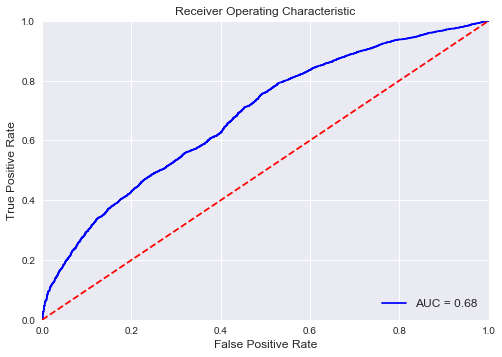

In [175]:
bdt = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1),
                         algorithm="SAMME",
                         n_estimators=250)

bdt.fit(X, Y)
probs = bdt.predict_proba(test_df)

fpr, tpr, thresholds = metrics.roc_curve(test_nom_y, probs[:, 1])
roc_auc = metrics.auc(fpr, tpr)

plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [101]:
#lasso
from sklearn import linear_model
print(len(train_df.columns))
X = train_df
y = np.exp(train_y)
clf = linear_model.Lasso(alpha=0.1)
clf.fit(X, y)
print("coefficient\n",clf.coef_)
print(len(clf.coef_))
print("iterations\n",clf.n_iter_)
print("intercept\n",clf.intercept_)
print("train data score\n",clf.score(train_df, y))
print("test data score\n",clf.score(test_df, np.exp(test_y)))
predictions = clf.predict(test_df)


43
coefficient
 [  1.09066246e-01  -0.00000000e+00   1.36455617e+03  -6.97010359e+03
  -0.00000000e+00   5.43598143e+02   1.20661897e+04  -2.14510000e+02
  -2.68128879e+02   1.02742273e+03   3.01737317e+03  -1.00385224e+03
   2.29934964e+03  -2.04355145e+03  -3.28851794e+02   2.83395756e+04
  -1.13783405e+03   4.03932591e+02  -1.43260146e+03   1.92193413e+02
   3.91757935e+02   1.83302666e+04   9.60168580e+02   9.94906150e+02
   2.95235172e+03   4.10733364e+02   5.31599685e+01  -1.38527268e+03
   4.34248782e+02   1.00203754e+03  -1.29566083e+02   5.62446694e+02
  -1.52672818e+03  -1.88796743e+03  -2.48404737e+02  -1.00243159e+03
  -4.07250442e+03   5.50894111e+02  -2.59432946e+02  -8.81300891e+02
   0.00000000e+00  -9.76426430e+02  -2.00788523e+03]
43
iterations
 145
intercept
 3351.44192552
train data score
 0.0210205311299
test data score
 0.0128265590784


In [102]:
X = train_df
y = train_y
clf = linear_model.LinearRegression(normalize=True)
clf.fit(X, y)
print("coeff ",clf.coef_)
print("intercept ",clf.intercept_)
print("score ",clf.score(test_df, test_y))
predictions = clf.predict(test_df)

coeff  [  2.45735601e+11  -1.96134886e-01   2.67412227e-01  -1.03843608e+00
   1.86986302e-02   1.06883382e-01   1.60454576e+00   2.45735601e+11
  -3.89732169e+01   2.31109812e-01   6.43005179e+01   1.28789827e-01
   1.53770310e-01  -1.29196974e-01  -3.90006033e+01   5.96412740e+00
  -1.49336193e-01  -3.82553428e+00  -2.32546294e-01   2.45735601e+11
   7.50713270e-02   1.49227330e+00   3.09421321e-02   2.81984075e-01
   4.71399855e-01   2.45735601e+11   1.87773074e-01  -1.34461395e-01
   2.08178017e-01   3.64461090e-01   2.45735601e+11  -3.87435180e+01
  -1.25542764e-01  -3.02456738e-01   2.45735601e+11  -3.89056999e+01
  -7.80071651e-01  -3.89604536e+01   3.90646098e-02  -2.92773825e-01
  -1.04590149e+02   3.27928478e-02  -9.83870459e-02]
intercept  -245735600516.0
score  0.106908512159


In [ ]:
X = train_df
y = train_y
clf = linear_model.LogisticRegression()
clf.fit(X, y)
print(clf.coef_)
print(clf.intercept_)
print(clf.score(test_df, test_y))
predictions = clf.predict(test_df)

In [167]:
from sklearn.cluster import KMeans
X = sel_df[list(columns)]
kmeans = KMeans(n_clusters=2, random_state=0).fit(X)
sel_df['kmeans'] = kmeans.predict(X)
centers = kmeans.cluster_centers_
kmeans.inertia_

C:\Users\pavan\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


88330.254923939181

In [162]:
print(pd.crosstab(sel_df['shares_nom'],sel_df['kmeans']))

kmeans         0      1
shares_nom             
0           3722   8702
1           4709  22511


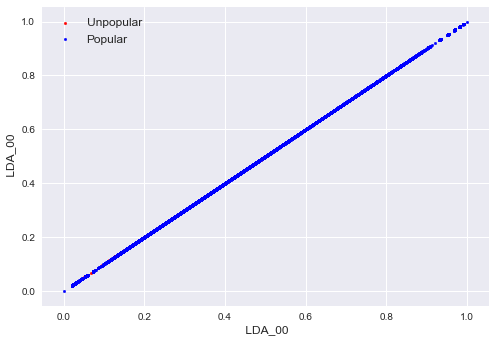

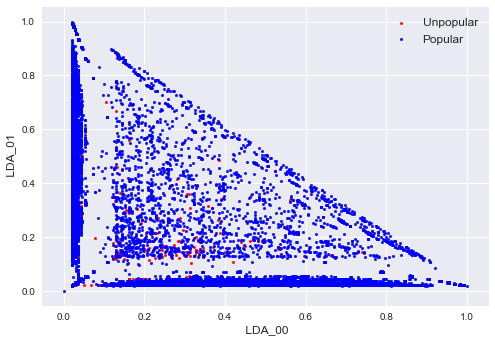

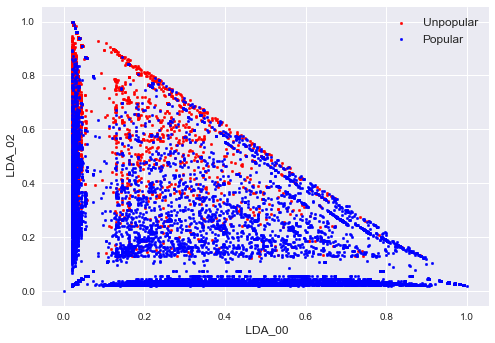

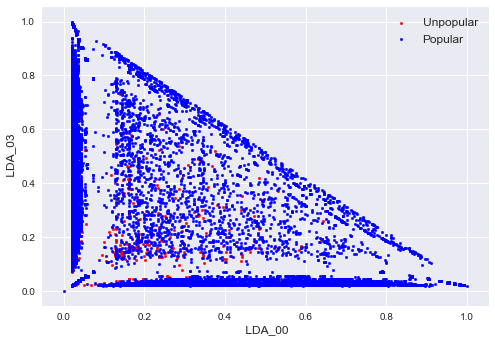

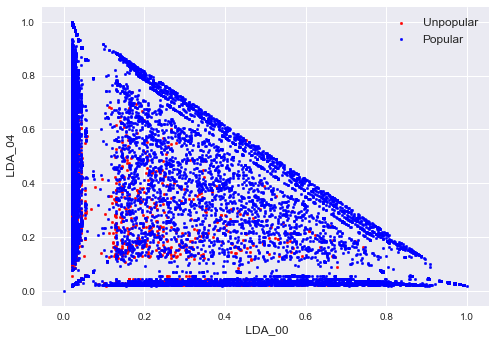

...

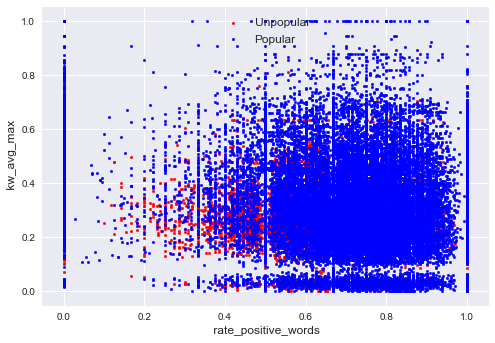

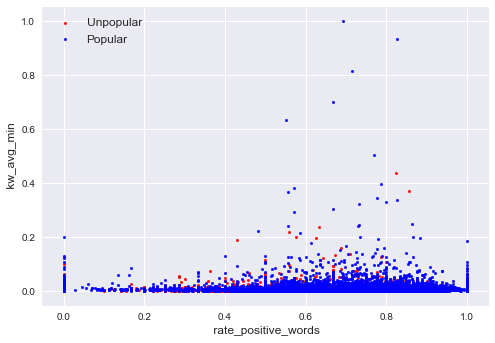

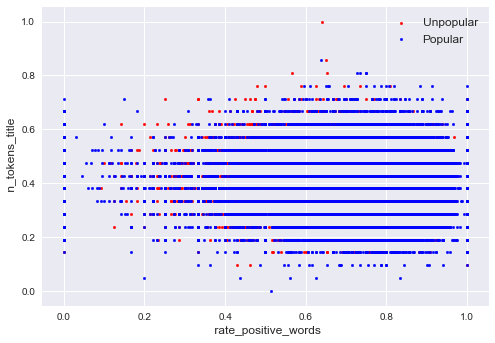

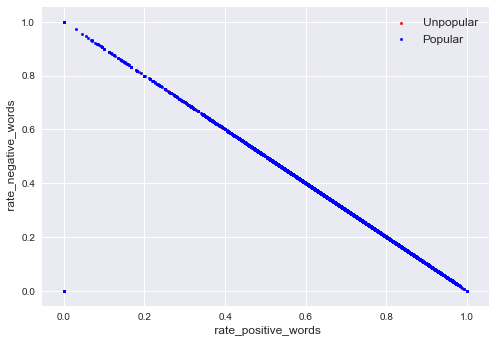

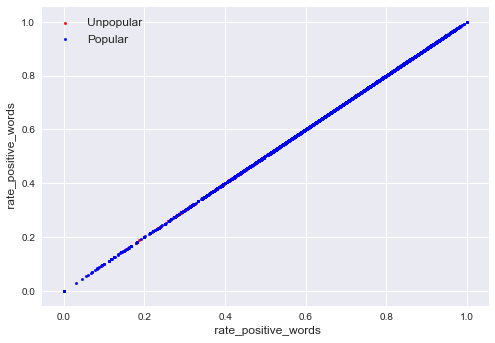

In [146]:
#custom coding to visualize cluster assignments of KMeans Model by plotting certain pairs of attributes
import itertools
list1= [' LDA_00', ' LDA_01', ' LDA_02', ' LDA_03', ' LDA_04',
 ' kw_avg_avg',
 ' kw_avg_max',
 ' kw_avg_min',
 ' n_tokens_title',
 ' rate_negative_words',
 ' rate_positive_words',
 ]
list2= list1
points1 = sel_df.loc[sel_df['kmeans'] == 0]
points2 = sel_df.loc[sel_df['kmeans'] == 1]

for a,b in itertools.product(list1,list2):
    fig, ax = plt.subplots()
    ax.scatter(points1[a], points1[b], s=7, c='r', label = 'Unpopular')
    ax.scatter(points2[a], points2[b], s=7, c='b', label = 'Popular')
    ax.legend()
    plt.xlabel(a)
    plt.ylabel(b)
    plt.show()

In [168]:

import time as time
import mpl_toolkits.mplot3d.axes3d as p3
from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets.samples_generator import make_swiss_roll

# Compute clustering
print("Compute unstructured hierarchical clustering...")
st = time.time()
ward = AgglomerativeClustering(n_clusters=2, linkage='ward').fit(X)
elapsed_time = time.time() - st
label = ward.labels_
print("Elapsed time: %.2fs" % elapsed_time)
print("Number of points: %i" % label.size)

ward

Compute unstructured hierarchical clustering...
Elapsed time: 300.78s
Number of points: 39644


AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
            connectivity=None, linkage='ward',
            memory=Memory(cachedir=None), n_clusters=2,
            pooling_func=<function mean at 0x000001D3C6431950>)

In [169]:
sel_df['hierarchical']= ward.labels_


C:\Users\pavan\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


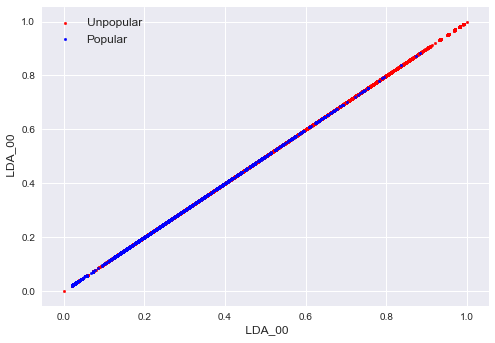

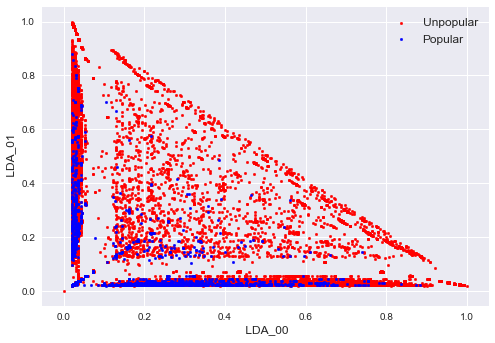

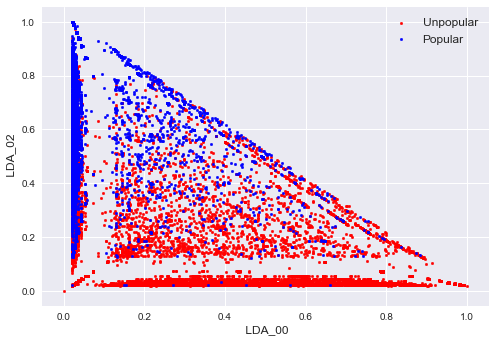

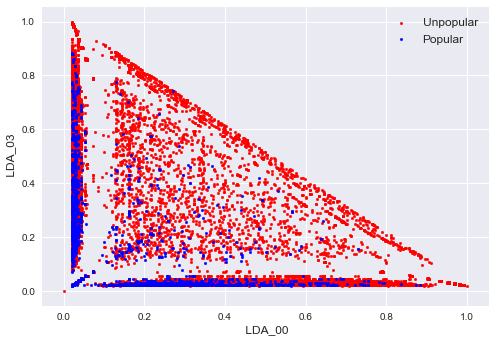

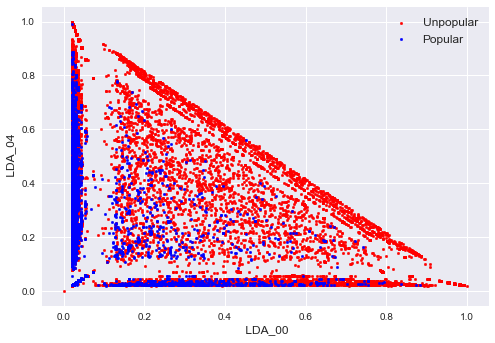

...

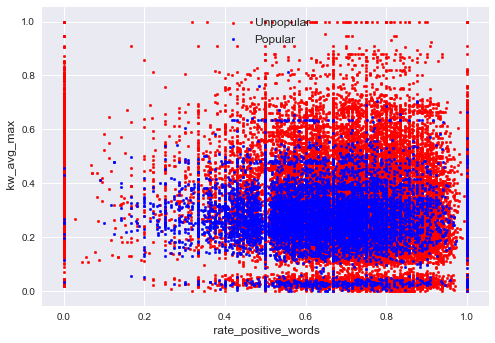

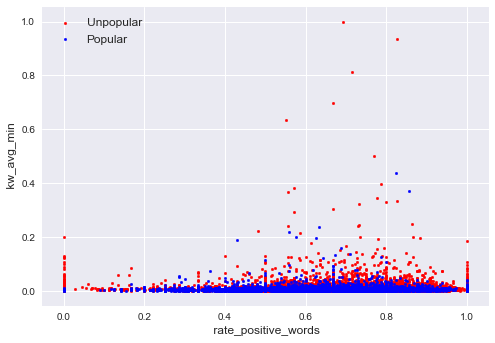

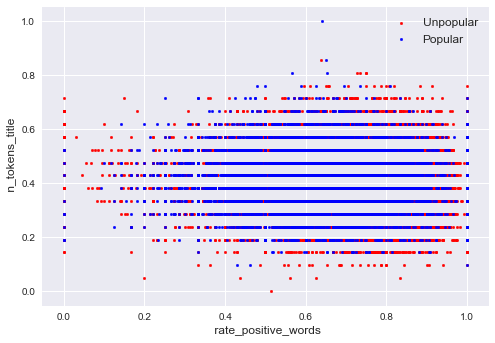

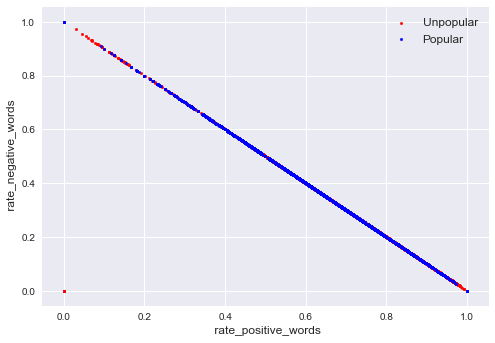

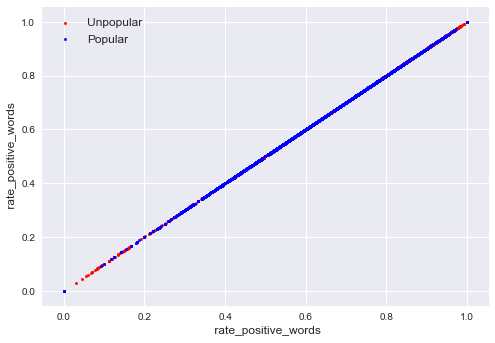

In [160]:
#custom coding to visualize cluster assignments of Agglomerative CLustering Model by plotting certain pairs of attributes

points1 = sel_df.loc[sel_df['ac'] == 0]
points2 = sel_df.loc[sel_df['ac'] == 1]

for a,b in itertools.product(list1,list2):
    fig, ax = plt.subplots()
    ax.scatter(points1[a], points1[b], s=7, c='r', label = 'Unpopular')
    ax.scatter(points2[a], points2[b], s=7, c='b', label = 'Popular')
    ax.legend()
    plt.xlabel(a)
    plt.ylabel(b)
    plt.show()

In [170]:
print(pd.crosstab(sel_df['shares_nom'],sel_df['hierarchical']))

hierarchical      0     1
shares_nom               
0              8774  3650
1             22702  4518
